In [1]:
import numpy as np
import pandas as pd
import scanpy as sc

/home/debnatho/anaconda3/envs/stream_pseudotime/lib/python3.6/site-packages/anndata/core/anndata.py:17: FutureWarning: pandas.core.index is deprecated and will be removed in a future version.  The public classes are available in the top-level namespace.
  from pandas.core.index import RangeIndex


In [2]:
import os
os.environ['R_HOME'] = '/home/debnatho/anaconda3/envs/stream_pseudotime/lib/R'

In [3]:
import stream as st

st.__version__

'1.0'

In [6]:
#Way to convert Seurat data to anndata:

#Import Seurat matrix in Scanpy: integrated matrix 
#adata_int = sc.read('DSC.integrated_counts.mtx').T  # transpose the data
#adata_int.var_names = pd.read_csv('DSC.integrated_genes.txt', header=None, sep='\n')[0]
#adata_int.obs_names = pd.read_csv('DSC.integrated_cell_barcodes.txt', header=None)[0]


#Add metadata to the anndata object in scanpy like this: 
#df_annotations_int = pd.read_csv("DSC.metadata.csv",header=0,index_col=[0])
#adata_int.obs = df_annotations_int

#The same for normalized data. 

In [4]:
#Read the integrated single cell anndata (done using Seurat v3.1.4 & then converted to anndata): 
adata_st = st.read(file_name= 'DSC_integrated_trajectory.h5ad', file_format= 'h5ad', workdir= './DSC_revised_results')
adata_st

Saving results in: ./DSC_revised_results


AnnData object with n_obs × n_vars = 2914 × 1557 
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'stim', 'percent.mt', 'S.Score', 'G2M.Score', 'Phase', 'old.ident', 'integrated_snn_res.0.5', 'seurat_clusters', 'group', 'disease', 'time', 'tissue', 'tissue_time', 'integrated_snn_res.1', 'integrated_snn_res.2', 'integrated_snn_res.3', 'cell_type', 'RNA_snn_res.0.8', 'Merged_cell_type_PC35', 'cell_type_merged', 'nCount_integrated', 'nFeature_integrated', 'C14_subclusters'
    uns: 'workdir'

In [5]:
sc.logging.print_versions()

scanpy==1.4.4.post1 anndata==0.6.22.post1 umap==0.3.10 numpy==1.18.1 scipy==1.4.1 pandas==1.0.1 scikit-learn==0.23.1 statsmodels==0.11.0 python-igraph==0.7.1 louvain==0.6.1


In [9]:
sc.settings.set_figure_params(dpi=80)

In [7]:
#Set to array:
adata_st.X = adata_st.X.toarray()

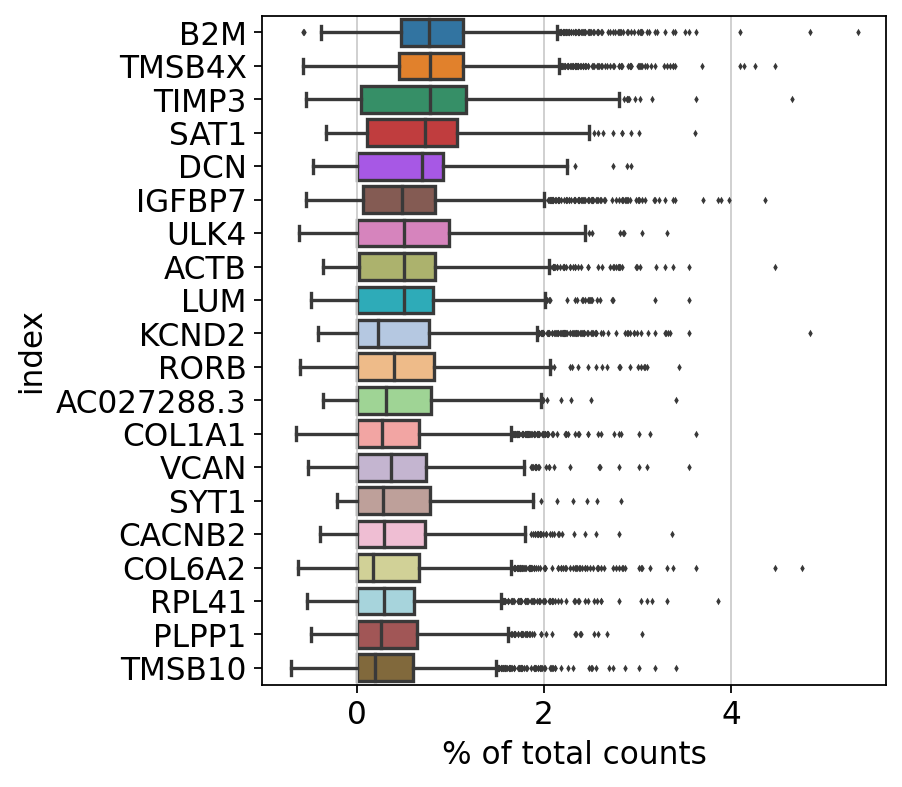

In [11]:
#Show those genes that yield the highest fraction of counts in each single cell, across all cells
sc.pl.highest_expr_genes(adata_st, n_top=20)

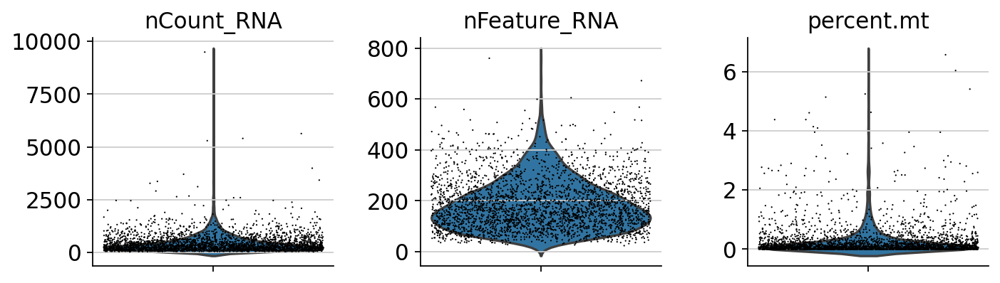

In [12]:
sc.pl.violin(adata_st, ['nCount_RNA', 'nFeature_RNA', 'percent.mt'],
             jitter=0.4, multi_panel=True) #percent.mt ~ <5%

In [13]:
#Subset only decidual cells:
include= ['Decidua']

adata_st= adata_st[adata_st.obs['tissue'].isin(include)]
adata_st 

View of AnnData object with n_obs × n_vars = 2909 × 1557 
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'stim', 'percent.mt', 'S.Score', 'G2M.Score', 'Phase', 'old.ident', 'integrated_snn_res.0.5', 'seurat_clusters', 'group', 'disease', 'time', 'tissue', 'tissue_time', 'integrated_snn_res.1', 'integrated_snn_res.2', 'integrated_snn_res.3', 'cell_type', 'RNA_snn_res.0.8', 'Merged_cell_type_PC35', 'cell_type_merged', 'nCount_integrated', 'nFeature_integrated', 'C14_subclusters'
    uns: 'workdir'

using all the features ...
10 PCs are selected


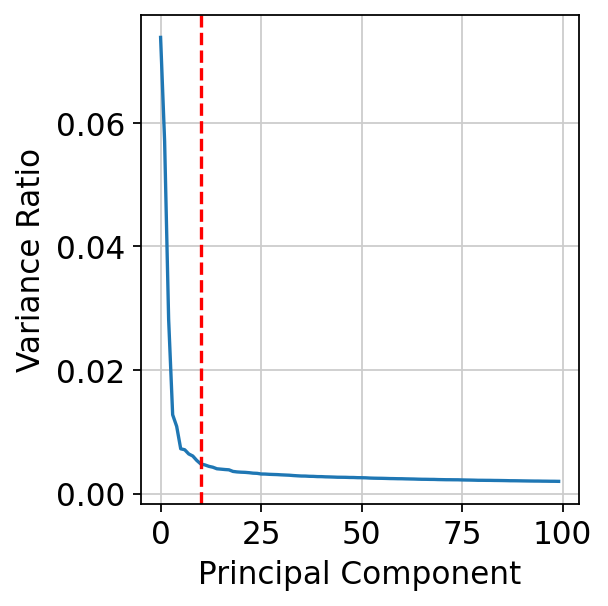

In [16]:
#Compute PCA on the subset: 
st.select_top_principal_components(adata_st, first_pc=True,n_pc=10)

In [17]:
include= ['Decidua']
adata_umap= adata_st[adata_st.obs['tissue'].isin(include)]
adata_umap

View of AnnData object with n_obs × n_vars = 2909 × 1557 
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'stim', 'percent.mt', 'S.Score', 'G2M.Score', 'Phase', 'old.ident', 'integrated_snn_res.0.5', 'seurat_clusters', 'group', 'disease', 'time', 'tissue', 'tissue_time', 'integrated_snn_res.1', 'integrated_snn_res.2', 'integrated_snn_res.3', 'cell_type', 'RNA_snn_res.0.8', 'Merged_cell_type_PC35', 'cell_type_merged', 'nCount_integrated', 'nFeature_integrated', 'C14_subclusters'
    uns: 'workdir', 'pca_variance_ratio', 'top_pcs', 'params'
    obsm: 'pca', 'top_pcs'

In [18]:
#C14_subcluster is the initial subcluster annotation from Seurat (for the dMSC lineage cell type/states)
#We referred to the trajectory analysis & developmental genes along with PAGA to confirm the final annotation of the cell types. 

adata_umap.uns['C14_subclusters_color'] = {'Cl-0': '#ff0000',
 'Cl-1': '#ff9999',
 'Cl-10': '#b59a31',
 'Cl-2': '#006600',
 'Cl-3': '#b30059',
 'Cl-4': '#34ae94',
 'Cl-5': '#006666',
 'Cl-6': '#00e6e6',
 'Cl-7': '#8e92f4',
 'Cl-8': '#da70f4',
 'Cl-9': '#f566c6'}

Trying to set attribute `.uns` of view, making a copy.


In [19]:
st.dimension_reduction(adata_umap, method= 'umap',feature='top_pcs',n_components=6,n_neighbors=15,n_jobs=4)

feature top_pcs is being used ...
4 cpus are being used ...


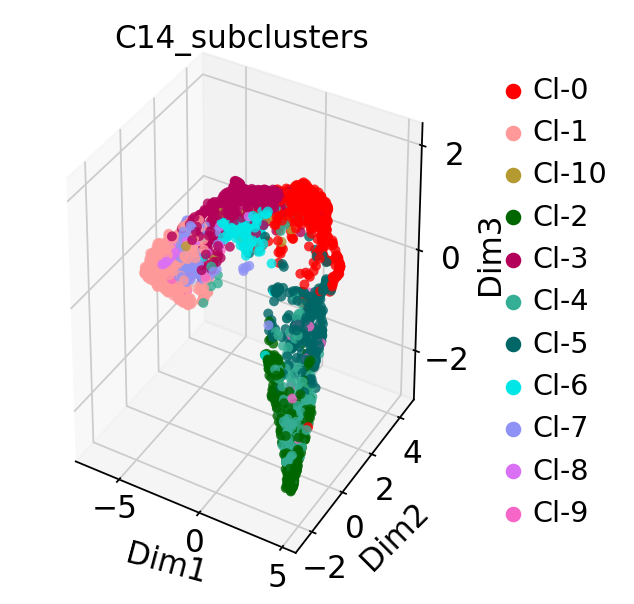

In [20]:
st.plot_dimension_reduction(adata_umap,color=['C14_subclusters'], show_graph=False,show_text=False)

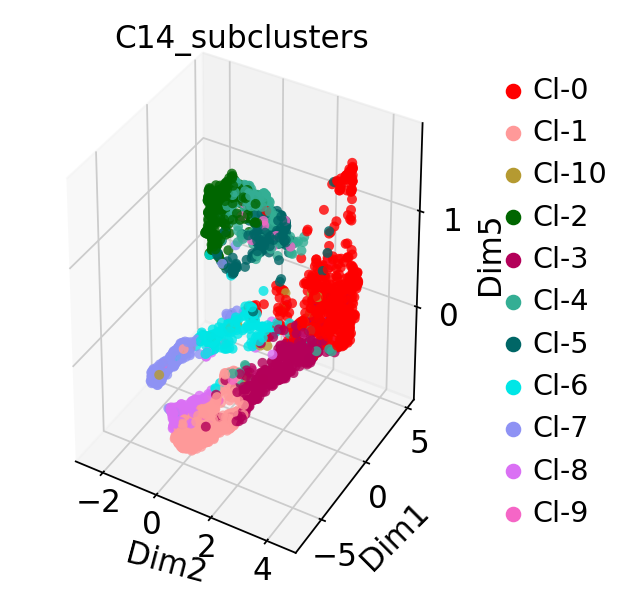

In [21]:
#Best resolves the components & capture the biological transitions between cell types/states: 
#Later used for supplementary figure. 
st.plot_dimension_reduction(adata_umap,color=['C14_subclusters'], show_graph=False,show_text=False,
                           comp1=1, comp2=0, comp3=4)

In [25]:
#Write this as pickel (.pkl) file for further use:
st.write(adata_umap,file_name= 'DSC_integrated_trajectory_manuscript.pkl')

In [26]:
#Read the original saved .pkl file from the above step: 
adata= st.read(file_name= './DSC_revised_results/DSC_integrated_trajectory_manuscript.pkl', workdir= './DSC_revised_results')

adata

Working directory is already specified as './DSC_revised_results' 
To change working directory, please run set_workdir(adata,workdir=new_directory)


AnnData object with n_obs × n_vars = 2909 × 1557 
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'stim', 'percent.mt', 'S.Score', 'G2M.Score', 'Phase', 'old.ident', 'integrated_snn_res.0.5', 'seurat_clusters', 'group', 'disease', 'time', 'tissue', 'tissue_time', 'integrated_snn_res.1', 'integrated_snn_res.2', 'integrated_snn_res.3', 'cell_type', 'RNA_snn_res.0.8', 'Merged_cell_type_PC35', 'cell_type_merged', 'nCount_integrated', 'nFeature_integrated', 'C14_subclusters'
    uns: 'workdir', 'pca_variance_ratio', 'top_pcs', 'params', 'C14_subclusters_color', 'trans_umap'
    obsm: 'pca', 'top_pcs', 'X_umap', 'X_dr'

In [27]:
#Make a cosmetic copy of anndata: 
adata_new= adata.copy() 

#Remove some of the problematic genes. 
adata_new = adata_new[:,adata_new.X.sum(axis=0) > 0]
adata_new

View of AnnData object with n_obs × n_vars = 2909 × 1407 
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'stim', 'percent.mt', 'S.Score', 'G2M.Score', 'Phase', 'old.ident', 'integrated_snn_res.0.5', 'seurat_clusters', 'group', 'disease', 'time', 'tissue', 'tissue_time', 'integrated_snn_res.1', 'integrated_snn_res.2', 'integrated_snn_res.3', 'cell_type', 'RNA_snn_res.0.8', 'Merged_cell_type_PC35', 'cell_type_merged', 'nCount_integrated', 'nFeature_integrated', 'C14_subclusters'
    uns: 'workdir', 'pca_variance_ratio', 'top_pcs', 'params', 'C14_subclusters_color', 'trans_umap'
    obsm: 'pca', 'top_pcs', 'X_umap', 'X_dr'

In [28]:
#Regress out the effects of MT genes & nCount_RNA before recomputing the nearest neighbor & principal graph.
sc.pp.regress_out(adata_new, ['nCount_RNA', 'percent.mt']) #this step doesn't affect the principal graph learning. It was repeated without this step before & obtained very similar results. 

#Rescale (to unit variance) after regressing:
sc.pp.scale(adata_new, max_value=10)

Importing precomputed principal components
10 PCs are selected


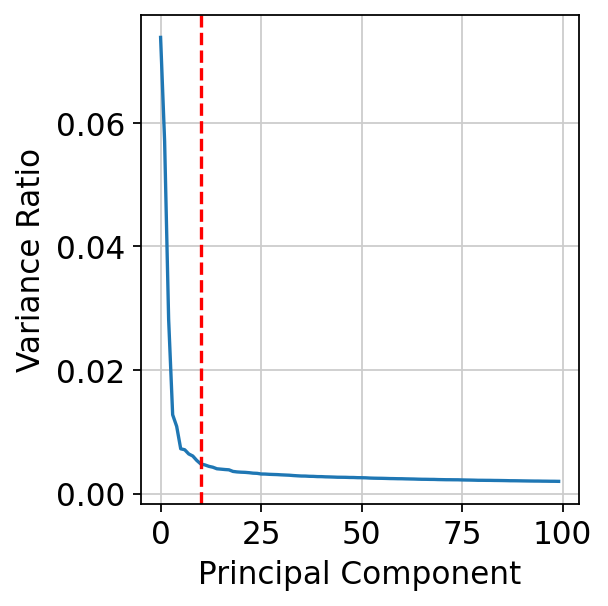

In [29]:
#Compute PCA: on the subset. 
st.select_top_principal_components(adata_new, first_pc=True,n_pc=10)

In [30]:
#Merge C14 subclusters & rename a/c to latest Seurat DSC clustering, guided by subcluster markers as well. 
#Source notebook: DSC_stream_manuscript_figures01.ipynb. 
adata_new.obs['cell_type_semifinal_v2'] = (adata_new.obs['C14_subclusters'].map(lambda x: {"Cl-0": "dMSC", 
                                                                            "Cl-1": "dDSC_1",
                                                                            "Cl-3": "dDSC_1",
                                                                            "Cl-8": "dDSC_1",
                                                                            "Cl-7": "dDSC_2",
                                                                            "Cl-10": "dDSC_2", 
                                                                            "Cl-6": "dFB_1", 
                                                                            "Cl-9": "dFB_1",
                                                                            "Cl-5": "dFB_2",
                                                                            "Cl-4": "dSMC", 
                                                                            "Cl-2": "dSMC"}.get(x, x)).astype("category"))

In [31]:
#Change the colors to match the main UMAP clusters. 
adata_new.uns['cell_type_semifinal_v2_color']= {'dMSC': '#9ac6c5',
 'dDSC_1': '#56cbf9',
 'dDSC_2': '#7c0b2b',
 'dFB_1': '#bf3100',
 'dFB_2': '#d76a03',
 'dSMC': '#0b1d51'}

In [32]:
adata_umap= adata_new.copy() 
st.dimension_reduction(adata_umap, method= 'umap',feature='top_pcs',n_components=6,n_neighbors=15,n_jobs=8)

feature top_pcs is being used ...
8 cpus are being used ...


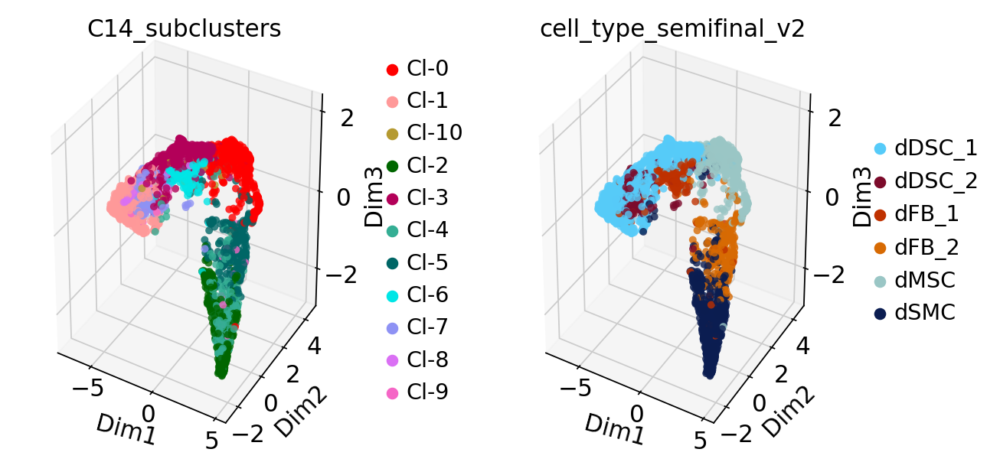

In [33]:
st.plot_dimension_reduction(adata_umap,color=['C14_subclusters', 'cell_type_semifinal_v2'], show_graph=False,show_text=False)

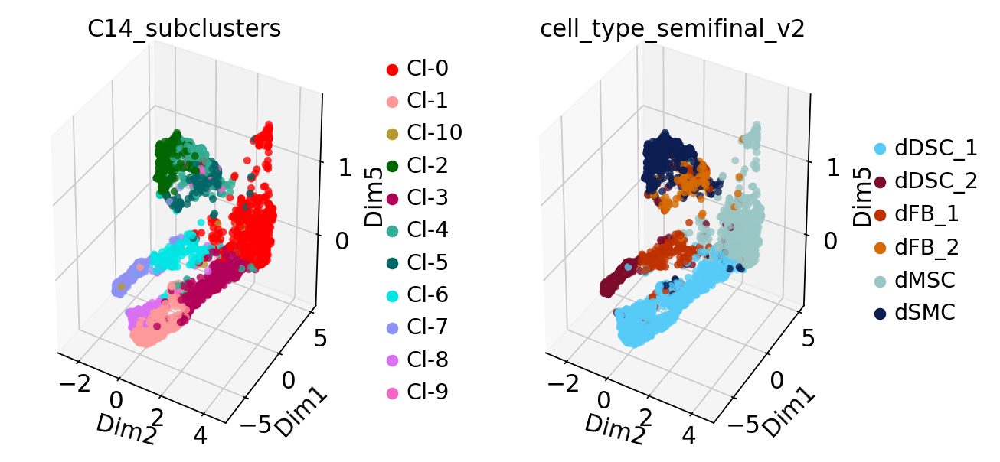

In [34]:
#Best resolves the biological relationship between cell types/states.
#for supplementary figure. 
st.plot_dimension_reduction(adata_umap,color=['C14_subclusters', 'cell_type_semifinal_v2'], show_graph=False,show_text=False,
                           comp1=1, comp2=0, comp3=4)

Seeding the initial tree structure (notes from the original publication): 
    
The principal graph inference is based on a greedy optimization procedure that may lead to local minima. The initialization method proposed by STREAM is shown to improve the quality of the inferred solutions and that in turn, speed up convergence. At first, the cells are clustered in the UMAP space (alternatively, one can use MLLE/SE) using the K-means method (alternatively, one can use affinity propagation method with a damping factor= 0.75). Based on the exemplars obtained, a minimum spanning tree (MST) is constructed using the Kruskal’s algorithm. The obtained tree serves as initial tree structure for the ElPiGraph procedure.

In [35]:
#Set seed of the elastic graph or seeding initial tree structure: 
st.seed_elastic_principal_graph(adata_umap,n_clusters= 5)

Seeding initial elastic principal graph...
Clustering...
K-Means clustering ...
The number of initial nodes is 5
Calculatng minimum spanning tree...
Number of initial branches: 3


Elastic Principal Graphs:
    
Elastic principal graphs are structured data approximators consisting of vertices connected by edges. The vertices are embedded into the space of the data & minimizes the mean squared distance (MSD) to the data points (similar to that of k-means). Unlike unstructured k-means, the edges connecting the vertices are used to define an elastic energy term. The elastic energy term and MSD are used to create penalties for edge stretching and bending of branches. To derive the optimal graph structure, ElPiGraph uses a topological grammar (or, graph grammar) approach, which is described in the original paper: https://www.nature.com/articles/s41467-019-09670-4

To learn principal graph in high-dimensional spaces, the procedure is as follows (taken from the main paper). 
Let H be the number of UMAP components.Then, the algorithm uses top L components to obtain a tree in a low dimensional subspace. Based on this tree, we calculate a principal graph in the L-dimensional space. Subsequently, the algorithm maps the learnt principal graph to the H-dimensional space such that for the coordinates of each node in the H-dimensional space, we obtain the first L coordinates from the L-dimensional space. For the other H−L coordinates, mean values of the coordinate of the cells assigned to a given node are used. If a given node does not have any assigned cells, inference the coordinates are done using k-nearest-neighbor strategy, i.e., the mean value of the nearest k cells is used to infer the node coordinate. The edges are instead preserved from the L-dimensional space. The node coordinate and edge information are then used to initialize a second-round of elastic principal graph inference in the H-dimensional space.  

In [36]:
#epg_alpha: alpha parameter of the penalized elastic energy.
#epg_mu: mu parameter used to compute the elastic energy.
#epg_lambda: lambda parameter used to compute the elastic energy

st.elastic_principal_graph(adata_umap,epg_alpha=0.02,epg_mu=0.08,epg_lambda=0.01, n_jobs=8)

Learning elastic principal graph...
[1]
 "Constructing tree 1 of 1 / Subset 1 of 1"


[1]
 "Computing EPG with 50 nodes on 2909 points and 6 dimensions"


[1]
 "Using a single core"


Nodes = 
5
 
6
 
7
 
8
 
9
 
10
 
11
 
12
 
13
 
14
 
15
 
16
 
17
 
18
 
19
 
20
 
21
 
22
 
23
 
24
 
25
 
26
 
27
 
28
 
29
 
30
 
31
 
32
 
33
 
34
 
35
 
36
 
37
 
38
 
39
 
40
 
41
 
42
 
43
 
44
 
45
 
46
 
47
 
48
 
49
 


BARCODE	ENERGY	NNODES	NEDGES	NRIBS	NSTARS	NRAYS	NRAYS2	MSE	MSEP	FVE	FVEP	UE	UR	URN	URN2	URSD

3||50
	
0.5558
	
50
	
49
	
42
	
3
	
0
	
0
	
0.3558
	
0.333
	
0.98
	
0.9813
	
0.1673
	
0.03271
	
1.635
	
81.77
	
0


21.531 sec elapsed

[[1]]



Number of branches after learning elastic principal graph: 7


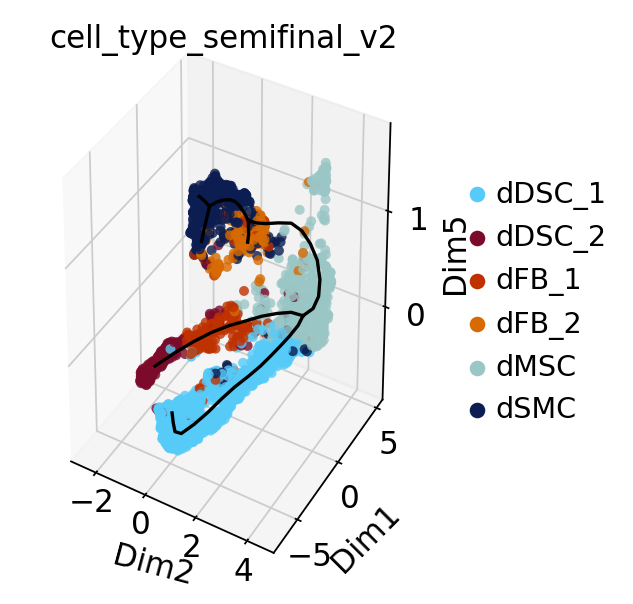

In [37]:
st.plot_dimension_reduction(adata_umap,color=['cell_type_semifinal_v2'], show_graph=True,show_text=False,
                           comp1=1, comp2=0, comp3=4) #save_fig=True to save the figure. 

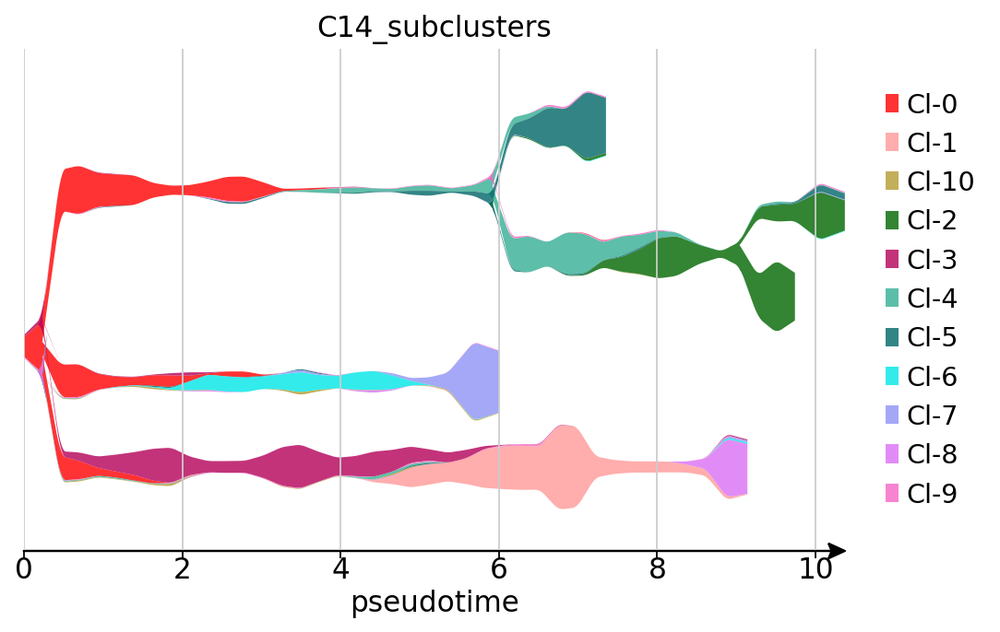

In [38]:
#Recapitulated. 
#C0 is the decidual MSC. Root at S0 is fine. 
st.plot_stream(adata_umap,root= 'S0',color=['C14_subclusters'], dist_scale=1)

In [39]:
#Read the normalized data for pseudotime marker analysis: 
adata_norm = sc.read_h5ad("/data/analysis/preeclampsia_2019/analysis/images/Final_umap_nature/Placenta_normalized_Seurat_markers.h5ad")

adata_norm.obs['cell_type_semifinal'].cat.categories

Index(['DSC_1', 'DSC_2', 'Unclassified_35', 'dDendritic_cell', 'dEVT',
       'dEpithelial_cell', 'dFB_1', 'dFB_2', 'dGranulocyte',
       'dLEC_dysfunctional', 'dLymphatic_EC', 'dMAC_activated',
       'dMAC_classical', 'dMesenchymal', 'dMonocyte', 'dNK_1', 'dNK_2',
       'dNK_prol', 'dPlasmaCell', 'dSCT', 'dSMC', 'dTcell', 'dVascular_EC',
       'vBcell', 'vDendritic_cell', 'vEVT', 'vErythroblast', 'vFibroblast',
       'vHoffbauer_cell', 'vMC', 'vMSC_15.2', 'vSCT_1', 'vSCT_2', 'vSCT_15.3',
       'vTcell', 'vTrophoblast_stem', 'vVCT', 'vVCT_prol', 'vVascular_EC'],
      dtype='object')

In [42]:
adata_norm.obs['cell_type_semifinal_v2'].cat.categories

Index(['DSC_1', 'DSC_2', 'Unclassified_35', 'dDC', 'dEVT', 'dEpC', 'dFB_1',
       'dFB_2', 'dGranulocyte', 'dLEC', 'dLEC_dysfunctional', 'dMAC_activated',
       'dMAC_classical', 'dMSC', 'dMonocyte', 'dNK_1', 'dNK_2', 'dNK_prol',
       'dPlasmaCell', 'dSCT', 'dSMC', 'dTcell', 'dVEC', 'vBcell', 'vDC', 'vEB',
       'vEVT', 'vFB', 'vHBC', 'vMC', 'vSCT_1', 'vSCT_2', 'vTSC', 'vTcell',
       'vVCT', 'vVCT_prol', 'vVEC', 'vtropho_15'],
      dtype='object')

In [43]:
#Subcluster MSC lineage cell types: 
dsc_clusters= ['dFB_1', 'dFB_2', 'dMSC', 'DSC_1', 'DSC_2', 'dSMC']

adata_dsc_norm= adata_norm[adata_norm.obs['cell_type_semifinal_v2'].isin(dsc_clusters)]

adata_dsc_norm

View of AnnData object with n_obs × n_vars = 2914 × 26115 
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'stim', 'percent.mt', 'S.Score', 'G2M.Score', 'Phase', 'old.ident', 'integrated_snn_res.0.5', 'seurat_clusters', 'group', 'disease', 'time', 'tissue', 'tissue_time', 'integrated_snn_res.1', 'integrated_snn_res.2', 'integrated_snn_res.3', 'cell_type', 'RNA_snn_res.0.8', 'Merged_cell_type_PC35', 'cell_type_merged', 'sub_cluster', 'sub_cluster_final', 'cell_type_semifinal', 'cell_type_semifinal_v2'
    uns: 'cell_type_semifinal_colors', 'umap_density_disease_params', 'umap_density_group_params', 'umap_density_params', 'umap_density_tissue_params'
    obsm: 'X_umap'

In [44]:
#Extract only decidual cells: 
tissue_type= ['Decidua']

adata_dsc_norm= adata_dsc_norm[adata_dsc_norm.obs['tissue'].isin(tissue_type)]
adata_dsc_norm

View of AnnData object with n_obs × n_vars = 2909 × 26115 
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'stim', 'percent.mt', 'S.Score', 'G2M.Score', 'Phase', 'old.ident', 'integrated_snn_res.0.5', 'seurat_clusters', 'group', 'disease', 'time', 'tissue', 'tissue_time', 'integrated_snn_res.1', 'integrated_snn_res.2', 'integrated_snn_res.3', 'cell_type', 'RNA_snn_res.0.8', 'Merged_cell_type_PC35', 'cell_type_merged', 'sub_cluster', 'sub_cluster_final', 'cell_type_semifinal', 'cell_type_semifinal_v2'
    uns: 'cell_type_semifinal_colors', 'umap_density_disease_params', 'umap_density_group_params', 'umap_density_params', 'umap_density_tissue_params'
    obsm: 'X_umap'

In [45]:
#Since the sequence/order of the cell barcodes exactly match for both adata_umap (integrated) & adata_dsc_norm (normalized), 
#we can transfer all the pseudotime & branch coordinates information from adata_umap.obs & adata_umap.uns to "adata_dsc_norm."

adata_dsc_norm.obs['S0_pseudotime']= adata_umap.obs['S0_pseudotime'] #S0_pseudotime: main ordering of cells. 

#Copy the .uns & .obsm back to the normalized data: 
adata_dsc_norm.uns = adata_umap.uns 

adata_dsc_norm.obsm= adata_umap.obsm #'X_dr', 'X_spring', 'X_stream_S0'

Trying to set attribute `.obs` of view, making a copy.


In [46]:
#Copy all the branch information: 
adata_dsc_norm.obs['branch_id']= adata_umap.obs['branch_id'] 
adata_dsc_norm.obs['branch_lam']= adata_umap.obs['branch_lam'] 

adata_dsc_norm.obs['branch_id_alias']= adata_umap.obs['branch_id_alias'] 
adata_dsc_norm.obs['branch_dist']= adata_umap.obs['branch_dist']

adata_dsc_norm.obs['node']= adata_umap.obs['node']

In [52]:
adata_dsc_norm.uns['cell_type_semifinal_v2_color']= {'dMSC': '#9ac6c5',
 'dDSC_1': '#56cbf9',
 'dDSC_2': '#7c0b2b',
 'dFB_1': '#bf3100',
 'dFB_2': '#d76a03',
 'dSMC': '#0b1d51'}

In [50]:
adata_dsc_norm.obs['C14_subclusters']= adata_umap.obs['C14_subclusters']

#Merge C14 subclusters & rename a/c to latest Seurat DSC clustering.
adata_dsc_norm.obs['cell_type_semifinal_v2'] = (adata_dsc_norm.obs['C14_subclusters'].map(lambda x: {"Cl-0": "dMSC", 
                                                                            "Cl-1": "dDSC_1",
                                                                            "Cl-3": "dDSC_1",
                                                                            "Cl-8": "dDSC_1",
                                                                            "Cl-7": "dDSC_2",
                                                                            "Cl-10": "dDSC_2", 
                                                                            "Cl-6": "dFB_1", 
                                                                            "Cl-9": "dFB_1",
                                                                            "Cl-5": "dFB_2",
                                                                            "Cl-4": "dSMC", 
                                                                            "Cl-2": "dSMC"}.get(x, x)).astype("category"))

In [54]:
st.set_figure_params(dpi= 400,style='white', rc={'image.cmap': 'RdBu_r'})

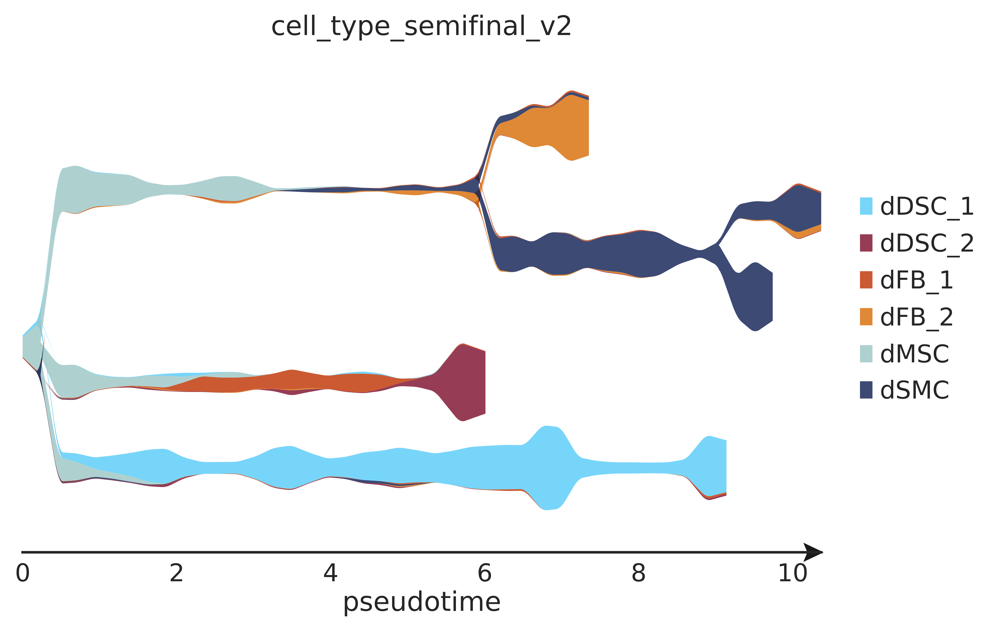

In [55]:
#Stream plot:
st.plot_stream(adata_dsc_norm,root= 'S0',color=['cell_type_semifinal_v2'], dist_scale=1)

In [56]:
#adata_umap.var

var_genes= adata_umap.var.index

var_genes

Index(['SEMA6D', 'TENM3', 'SPP1', 'F13A1', 'SLIT2', 'FN1', 'RBPJ', 'LINC01320',
       'RHEX', 'EGFL7',
       ...
       'FDCSP', 'AC021739.2', 'AC100803.3', 'TUBB', 'DYNLL1', 'AL136460.1',
       'AC073263.1', 'AL138737.1', 'KCNA7', 'LINC01050'],
      dtype='object', name='index', length=1407)

In [57]:
adata_leaf= adata_dsc_norm.copy()

#Subset 1407 genes used for learning the trajectory principal graph. 
adata_leaf= adata_leaf[:,var_genes]
adata_leaf

View of AnnData object with n_obs × n_vars = 2909 × 1407 
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'stim', 'percent.mt', 'S.Score', 'G2M.Score', 'Phase', 'old.ident', 'integrated_snn_res.0.5', 'seurat_clusters', 'group', 'disease', 'time', 'tissue', 'tissue_time', 'integrated_snn_res.1', 'integrated_snn_res.2', 'integrated_snn_res.3', 'cell_type', 'RNA_snn_res.0.8', 'Merged_cell_type_PC35', 'cell_type_merged', 'sub_cluster', 'sub_cluster_final', 'cell_type_semifinal', 'cell_type_semifinal_v2', 'S0_pseudotime', 'branch_id', 'branch_lam', 'branch_id_alias', 'branch_dist', 'node', 'C14_subclusters'
    uns: 'workdir', 'pca_variance_ratio', 'top_pcs', 'params', 'C14_subclusters_color', 'trans_umap', 'cell_type_semifinal_v2_color', 'epg', 'flat_tree', 'seed_epg', 'seed_flat_tree', 'ori_epg', 'epg_obj', 'ori_epg_obj'
    obsm: 'pca', 'top_pcs', 'X_umap', 'X_dr'

In [58]:
adata_leaf.X = adata_leaf.X.toarray() #Important step.

In [59]:
#Subset controls: for the final trajectory & computing pseudotime genes- leaf; transition & diverging genes between branches. 
 
include= ['Early_Decidua_C', 'Late_Decidua_C']
adata_late = adata_leaf[adata_leaf.obs['group'].isin(include)]
adata_late

View of AnnData object with n_obs × n_vars = 2290 × 1407 
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'stim', 'percent.mt', 'S.Score', 'G2M.Score', 'Phase', 'old.ident', 'integrated_snn_res.0.5', 'seurat_clusters', 'group', 'disease', 'time', 'tissue', 'tissue_time', 'integrated_snn_res.1', 'integrated_snn_res.2', 'integrated_snn_res.3', 'cell_type', 'RNA_snn_res.0.8', 'Merged_cell_type_PC35', 'cell_type_merged', 'sub_cluster', 'sub_cluster_final', 'cell_type_semifinal', 'cell_type_semifinal_v2', 'S0_pseudotime', 'branch_id', 'branch_lam', 'branch_id_alias', 'branch_dist', 'node', 'C14_subclusters'
    uns: 'workdir', 'pca_variance_ratio', 'top_pcs', 'params', 'C14_subclusters_color', 'trans_umap', 'cell_type_semifinal_v2_color', 'epg', 'flat_tree', 'seed_epg', 'seed_flat_tree', 'ori_epg', 'epg_obj', 'ori_epg_obj'
    obsm: 'pca', 'top_pcs', 'X_umap', 'X_dr'

In [60]:
adata_late.obs['group'].value_counts()

Early_Decidua_C    1235
Late_Decidua_C     1055
Name: group, dtype: int64

In [61]:
adata_late.obs['cell_type_semifinal_v2'].value_counts()

dDSC_1    783
dSMC      552
dMSC      476
dFB_1     185
dDSC_2    148
dFB_2     146
Name: cell_type_semifinal_v2, dtype: int64

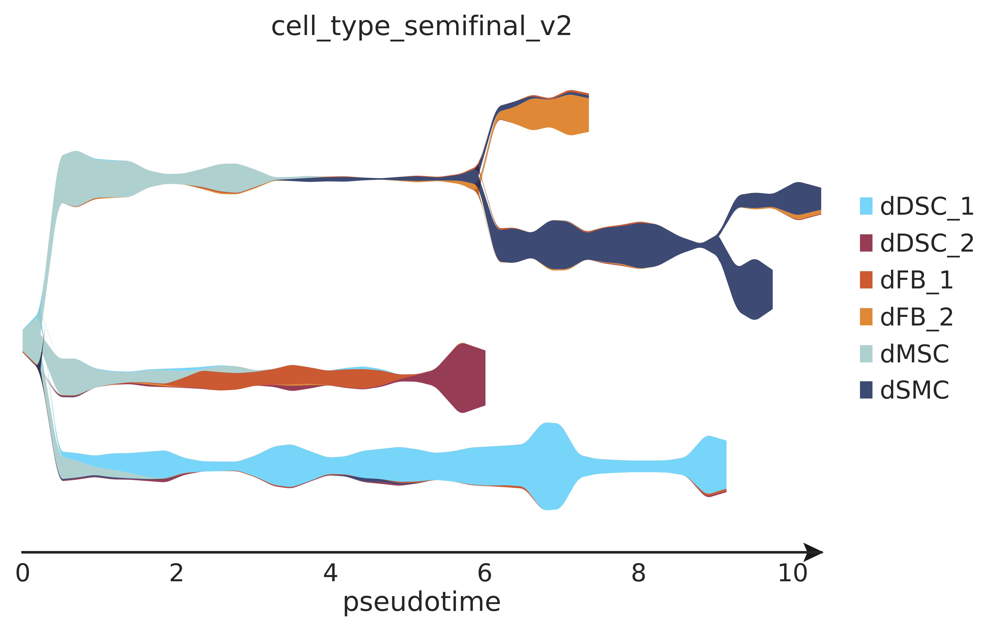

In [62]:
#Backup notebook: Control_trajectory_manuscript_1304.ipynb
#Figure main2A: Control dMSC lineage stream plot. 
st.plot_stream(adata_late,root= 'S0',color=['cell_type_semifinal_v2'], dist_scale=1)

In [63]:
#To save plots:

#st.plot_stream(adata_late,root= 'S0',color=['cell_type_semifinal_v2'], dist_scale=1, save_fig=True)
#st.plot_stream(adata_late,root= 'S0',color=['S0_pseudotime'], dist_scale=1, save_fig=True)
#st.plot_stream_sc(adata_late,root= 'S0',color=['group'], save_fig=True)

In [ ]:
st.set_figure_params(dpi= 80,style='white', rc={'image.cmap': 'RdBu_r'})

Trying to set attribute `.uns` of view, making a copy.


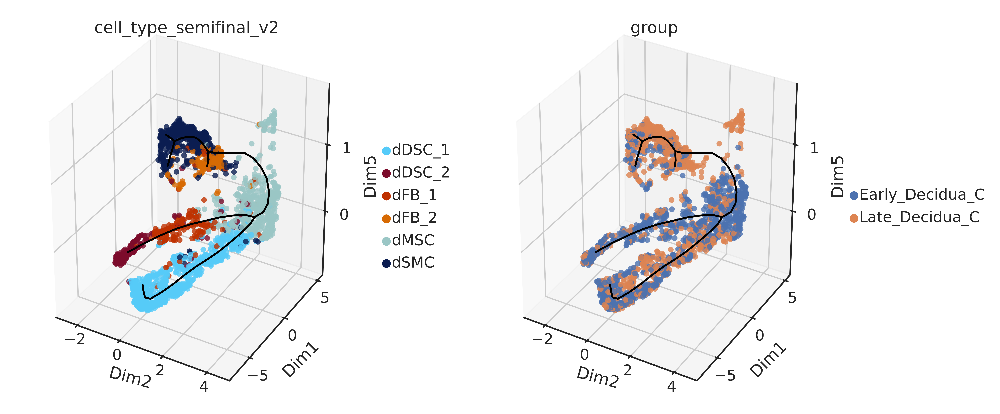

In [64]:
st.plot_dimension_reduction(adata_late,color=['cell_type_semifinal_v2', 'group'], show_graph=True,show_text=False,
                           comp1=1, comp2=0, comp3=4) #save_fig=True

##(Extended figure 4b: Principal graph on reduced UMAP space (only the left hand side image is shown)

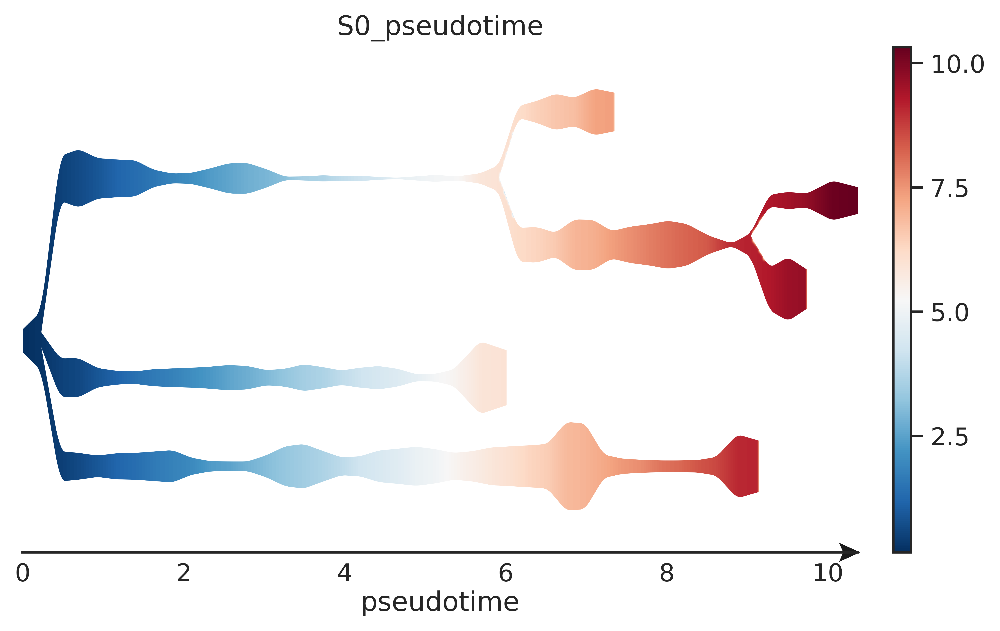

In [65]:
#Pseudotime plot: root is set to S0 (captured dMSC in an unsupervised way)
#Extended figure 4a.  
st.plot_stream(adata_late,root= 'S0',color=['S0_pseudotime'], dist_scale=1)

In [67]:
adata_late.uns['workdir']

'./DSC_revised_results'

In [68]:
adata_late.uns['workdir']= './DSC_pseudotime_genes'

In [69]:
#PART-II: Analyze leaf markers (all) for characterizing each lineage branches & terminal states. 
#Inferred by comparing multiple branches & relates to different committed states used for distinguishing lineages. 

st.detect_leaf_markers(adata_late, marker_list=None, cutoff_zscore=1.0,cutoff_pvalue=0.01, 
                       root='S0',n_jobs=15, use_precomputed=False)

Scanning all features ...
Filtering out markers that are expressed in less than 5 cells ...
15 cpus are being used ...
1350 markers are being scanned ...


In [70]:
#Detect transition markers: dynamical genes & can be thought as developmental drivers. 
#Longer the branch, the significant a transition gene would be. 
st.detect_transition_markers(adata_late,cutoff_spearman=0.3,cutoff_logfc=0.20, 
                             root= 'S0',n_jobs= 15, use_precomputed=False)

Scanning all features ...
Filtering out markers that are expressed in less than 5 cells ...
15 cpus are being used ...
1350 markers are being scanned ...


In [71]:
#Write the whole trajectory data as .pkl file for further use & visualizing with webtool (for experimentalists)
st.write(adata_late, file_name= "Control_DSC_trajectory_1304.pkl")

Selective transition genes having clear biological significance are plotted (as a function of pseudotime). 
A couple of transition genes are also leaf genes as their expression dynamically varies upto a point & then ~constant level. 

In [72]:
import matplotlib.pyplot as plt
import seaborn as sns

In [73]:
#Subset dDSC1 lineage: or dDSC_1 specific branches. 
dsc1_clusters= [('S1', 'S0')]

adata_dsc= adata_late[adata_late.obs['branch_id_alias'].isin(dsc1_clusters)]
adata_dsc.obs['branch_id_alias'].value_counts()


dsc_clusters_include= ['dMSC', 'dDSC_1']
adata_dsc_new = adata_dsc[adata_dsc.obs['cell_type_semifinal_v2'].isin(dsc_clusters_include)]
adata_dsc_new.obs['cell_type_semifinal_v2'].value_counts()

adata_dsc_new.obs['cell_type_semifinal_v2'].cat.categories
#Include the corresponding color codes: 
dsc_col_clust= ['#56cbf9', '#9ac6c5']

Text(0.5, 0, 'Cell-to-cell distance')

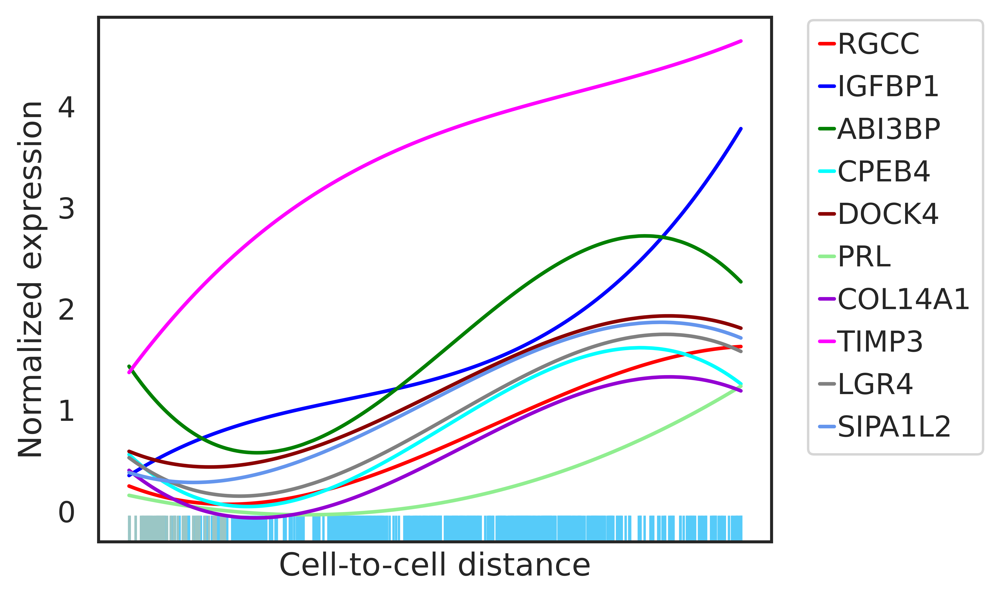

In [74]:
#(Extended figure 4g): DSC1. 

#Selective DSC_1 lineage genes: 
dsc_genes= ['RGCC', 'IGFBP1', 'ABI3BP', 'CPEB4', 'DOCK4', 'PRL', 'COL14A1', 'TIMP3', 'LGR4', 'SIPA1L2']

df=pd.DataFrame(adata_dsc_new[:,dsc_genes].copy().X,columns=dsc_genes)

df['pseudotime']= adata_dsc_new.obs['S0_pseudotime'].values
df['clusters']= adata_dsc_new.obs['cell_type_semifinal_v2'].values
df=df.sort_values(by='pseudotime',ascending=True)

plt.rcParams['figure.figsize'] = (5, 4)

fig,ax=plt.subplots()

#Make the top 10 gene colors consistent with trophoblast: 
cols=['red','blue','green','cyan','darkred','lightgreen','darkviolet','magenta',
      'grey','cornflowerblue','lightsalmon', 'peru',
     'pink', 'yellow']

for i,gene in enumerate(dsc_genes):
    fit=np.polyfit(df['pseudotime'].values,df[gene].values,deg=3)
    f = np.poly1d(fit)
    
    sns.lineplot(y=f(df['pseudotime']), x=df['pseudotime'].values,color=cols[i],ax=ax,label=gene)
for i,clust in enumerate(adata_dsc_new.obs['cell_type_semifinal_v2'].cat.categories):
    df_sub=df[np.isin(df['clusters'],clust)]
    sns.distplot(df_sub['pseudotime'],kde=False, hist=False, rug=True, ax=ax,color= dsc_col_clust[i])

ax.set_xticks([])
ax.set_xticklabels([])
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.ylabel('Normalized expression')
plt.xlabel('Cell-to-cell distance')
#plt.savefig("./DSC_revised_results/transition_plots/DSC1_lineage_transitionGenes_final_v1.pdf", dpi=800, papertype= "executive", bbox_inches='tight')
#plt.savefig("./DSC_revised_results/transition_plots/DSC1_lineage_transitionGenes_final_v1.svg", dpi=800, papertype= "executive", bbox_inches='tight')

In [75]:
#Subset DSC2 lineage: 
dsc_clusters= [('S2', 'S0')]

adata_dsc= adata_late[adata_late.obs['branch_id_alias'].isin(dsc_clusters)]
#adata_dsc.obs['branch_id_alias'].value_counts()

#Subset dDSC_2 lineage: 'dMSC', 'dFB_1', 'dDSC_2'
dsc_clusters_include= ['dMSC', 'dFB_1', 'dDSC_2']
adata_dsc_new = adata_dsc[adata_dsc.obs['cell_type_semifinal_v2'].isin(dsc_clusters_include)]
adata_dsc_new.obs['cell_type_semifinal_v2'].value_counts()

#Include the corresponding color codes: 
dsc_col_clust= ['#7c0b2b', '#bf3100', '#9ac6c5']

Text(0.5, 0, 'Cell-to-cell distance')

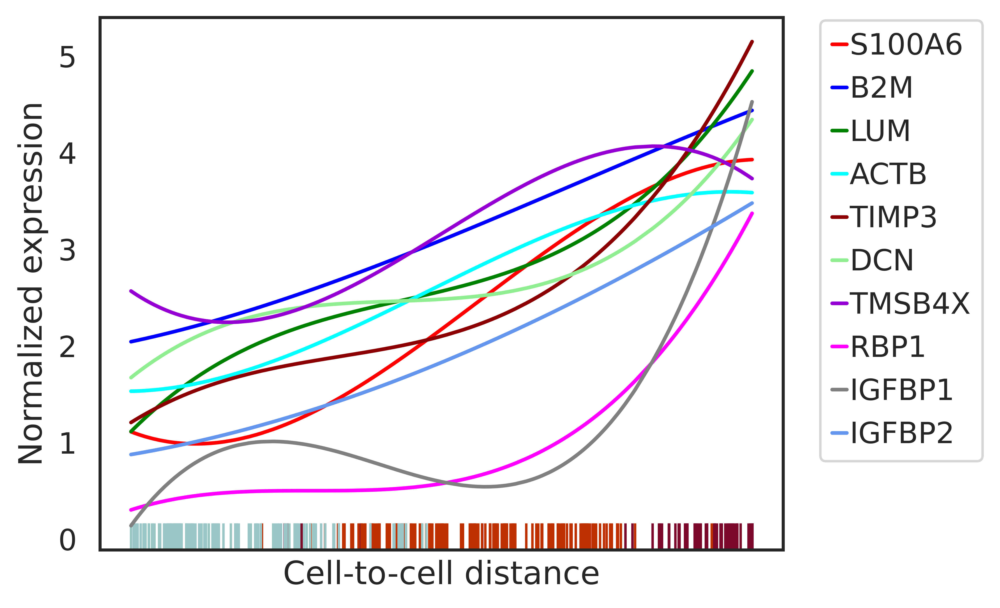

In [76]:
#(Extended figure 4g): DSC2

#Selective DSC2 genes:
dsc2_genes= ['S100A6', 'B2M', 'LUM', 'ACTB', 'TIMP3', 'DCN', 'TMSB4X', 'RBP1', 'IGFBP1', 'IGFBP2']

df=pd.DataFrame(adata_dsc_new[:, dsc2_genes].copy().X,columns=dsc2_genes)

df['pseudotime']= adata_dsc_new.obs['S0_pseudotime'].values
df['clusters']= adata_dsc_new.obs['cell_type_semifinal_v2'].values
df=df.sort_values(by='pseudotime',ascending=True)

plt.rcParams['figure.figsize'] = (5, 4)

fig,ax=plt.subplots()

#Make the top 10 gene colors consistent with trophoblast: 
cols=['red','blue','green','cyan','darkred','lightgreen','darkviolet','magenta',
      'grey','cornflowerblue','lightsalmon', 'peru',
     'pink', 'yellow']

for i,gene in enumerate(dsc2_genes):
    fit=np.polyfit(df['pseudotime'].values,df[gene].values,deg=3)
    f = np.poly1d(fit)
    
    sns.lineplot(y=f(df['pseudotime']), x=df['pseudotime'].values,color=cols[i],ax=ax,label=gene)
for i,clust in enumerate(adata_dsc_new.obs['cell_type_semifinal_v2'].cat.categories):
    df_sub=df[np.isin(df['clusters'],clust)]
    sns.distplot(df_sub['pseudotime'],kde=False, hist=False, rug=True, ax=ax,color= dsc_col_clust[i])

ax.set_xticks([])
ax.set_xticklabels([])
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.ylabel('Normalized expression')
plt.xlabel('Cell-to-cell distance')
#plt.savefig("./DSC_revised_results/transition_plots/DSC2_lineage_transitionGenes_final_v1.pdf", dpi=800, papertype= "executive", bbox_inches='tight')
#plt.savefig("./DSC_revised_results/transition_plots/DSC2_lineage_transitionGenes_final_v1.svg", dpi=800, papertype= "executive", bbox_inches='tight')

In [80]:
#adata_late

In [81]:
#Read the control file. 
adata_st = st.read(file_name= './DSC_revised_results/Control_DSC_trajectory_revised_0605.pkl', workdir= './DSC_revised_results')

adata_st

Working directory is already specified as './DSC_revised_results' 
To change working directory, please run set_workdir(adata,workdir=new_directory)


AnnData object with n_obs × n_vars = 2290 × 1407 
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'stim', 'percent.mt', 'S.Score', 'G2M.Score', 'Phase', 'old.ident', 'integrated_snn_res.0.5', 'seurat_clusters', 'group', 'disease', 'time', 'tissue', 'tissue_time', 'integrated_snn_res.1', 'integrated_snn_res.2', 'integrated_snn_res.3', 'cell_type', 'RNA_snn_res.0.8', 'Merged_cell_type_PC35', 'cell_type_merged', 'sub_cluster', 'sub_cluster_final', 'cell_type_semifinal', 'cell_type_semifinal_v2', 'S0_pseudotime', 'branch_id', 'branch_lam', 'branch_id_alias', 'branch_dist', 'node', 'C14_subclusters'
    uns: 'workdir', 'var_genes', 'pca_variance_ratio', 'top_pcs', 'params', 'C14_subclusters_color', 'trans_umap', 'group_color', 'epg', 'flat_tree', 'seed_epg', 'seed_flat_tree', 'ori_epg', 'epg_obj', 'ori_epg_obj', 'stim_color', 'scaled_marker_expr', 'leaf_markers_all', 'leaf_markers', 'de_markers_greater', 'de_markers_less', 'transition_markers', 'stream_S0', 'cell_type_semifinal_v2_colo

In [90]:
adata_late= adata_st.copy()

#Subset dFB_2 lineage: or S3S4 specific branches. 
fb_clusters= [('S0', 'S3'), ('S4', 'S3')]
adata_fb= adata_late[adata_late.obs['branch_id_alias'].isin(fb_clusters)]
adata_fb.obs['branch_id_alias'].value_counts()


#Subset dFB_2 lineage only: 'dMSC', 'dFB_1', 'dFB_2.'
fb_include= ['dMSC', 'dFB_2', 'dSMC']
adata_fb_new = adata_fb[adata_fb.obs['cell_type_semifinal_v2'].isin(fb_include)]
adata_fb_new.obs['cell_type_semifinal_v2'].value_counts()

dMSC     277
dFB_2    126
dSMC      43
Name: cell_type_semifinal_v2, dtype: int64

In [91]:
#Include the corresponding color codes: 
fb_col_clust= ['#d76a03', '#9ac6c5', '#0b1d51'] #['dFB_2', 'dMSC', 'dSMC']

In [92]:
#dFB_2 transition genes: 
fb_genes= ['ACTA2', 'TAGLN', 'FN1', 'SPARC', 'TPM2', 'CARMN', 'COL1A1', 'COL18A1', 'COL1A2', 'NOTCH3']

df=pd.DataFrame(adata_fb_new[:,fb_genes].copy().X,columns= fb_genes)
df['pseudotime']= adata_fb_new.obs['S0_pseudotime'].values
df['clusters']= adata_fb_new.obs['cell_type_semifinal_v2'].values
df=df.sort_values(by='pseudotime',ascending=True)

Text(0.5, 0, 'Cell-to-cell distance')

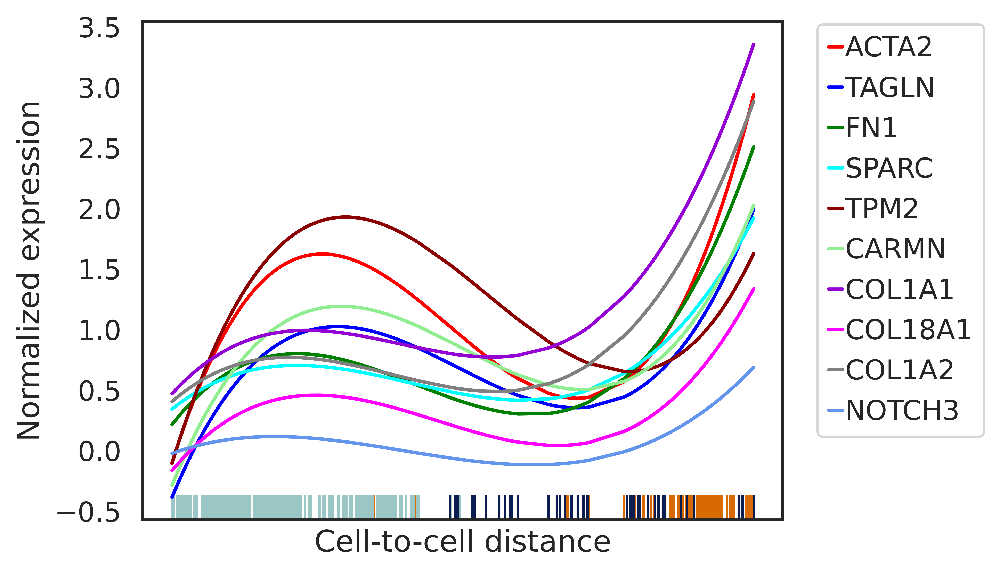

In [96]:
plt.rcParams['figure.figsize'] = (5, 4)

fig,ax=plt.subplots()

#Make the top 10 gene colors consistent with trophoblast: 
cols=['red','blue','green','cyan','darkred','lightgreen','darkviolet','magenta',
      'grey','cornflowerblue','lightsalmon', 'peru',
     'pink', 'yellow']

for i,gene in enumerate(fb_genes):
    fit=np.polyfit(df['pseudotime'].values,df[gene].values,deg=3)
    f = np.poly1d(fit)
    
    sns.lineplot(y=f(df['pseudotime']), x=df['pseudotime'].values,color=cols[i],ax=ax,label=gene)
for i,clust in enumerate(adata_fb_new.obs['cell_type_semifinal_v2'].cat.categories):
    df_sub=df[np.isin(df['clusters'],clust)]
    sns.distplot(df_sub['pseudotime'],kde=False, hist=False, rug=True, ax=ax,color= fb_col_clust[i])

ax.set_xticks([])
ax.set_xticklabels([])

plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.ylabel('Normalized expression')
plt.xlabel('Cell-to-cell distance')
#plt.savefig("./DSC_revised_results/transition_plots/dFB2_lineage_transitionGenes_final_v2.pdf", dpi=800, papertype= "executive", bbox_inches='tight')
#plt.savefig("./DSC_revised_results/transition_plots/dFB2_lineage_transitionGenes_final_v2.svg", dpi=800, papertype= "executive", bbox_inches='tight')

Text(0.5, 0, 'Cell-to-cell distance')

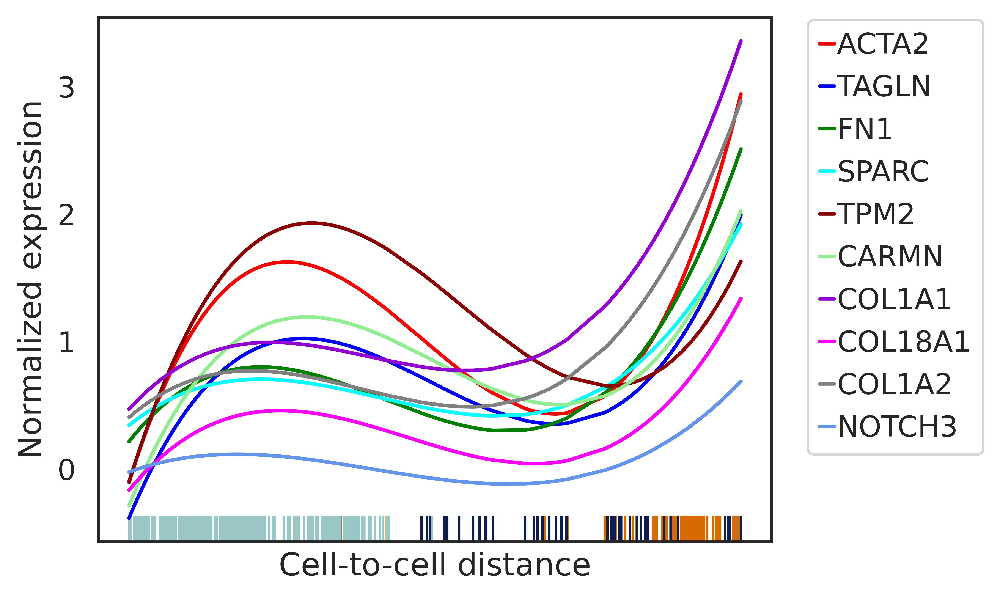

In [98]:
#(Extended figure 4g): dFB2. 
plt.rcParams['figure.figsize'] = (5, 4)

fig,ax=plt.subplots()

#Make the top 10 gene colors consistent with trophoblast: 
cols=['red','blue','green','cyan','darkred','lightgreen','darkviolet','magenta',
      'grey','cornflowerblue','lightsalmon', 'peru',
     'pink', 'yellow']

for i,gene in enumerate(fb_genes):
    fit=np.polyfit(df['pseudotime'].values,df[gene].values,deg=3)
    f = np.poly1d(fit)
    
    sns.lineplot(y=f(df['pseudotime']), x=df['pseudotime'].values,color=cols[i],ax=ax,label=gene)
for i,clust in enumerate(adata_fb_new.obs['cell_type_semifinal_v2'].cat.categories):
    df_sub=df[np.isin(df['clusters'],clust)]
    sns.distplot(df_sub['pseudotime'],kde=False, hist=False, rug=True, ax=ax,color= fb_col_clust[i])

ax.set_xticks([])
ax.set_xticklabels([])
ax.set_yticks([0,1,2,3])

plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.ylabel('Normalized expression')
plt.xlabel('Cell-to-cell distance')
#plt.savefig("./DSC_revised_results/transition_plots/dFB2_lineage_transitionGenes_final_v2.pdf", dpi=800, papertype= "executive", bbox_inches='tight')
#plt.savefig("./DSC_revised_results/transition_plots/dFB2_lineage_transitionGenes_final_v2.svg", dpi=800, papertype= "executive", bbox_inches='tight')

In [87]:
#Subset SMC lineage: 
smc_clusters= [('S0', 'S3'), ('S5', 'S3'), ('S7', 'S5'), ('S6', 'S5')]

adata_smc= adata_late[adata_late.obs['branch_id_alias'].isin(smc_clusters)]
adata_smc.obs['branch_id_alias'].value_counts()

(S0, S3)    312
(S5, S3)    311
(S6, S5)    123
(S7, S5)     87
Name: branch_id_alias, dtype: int64

In [88]:
#Subset dFB_2 lineage only: 'dMSC', 'dFB_1', 'dFB_2.'
smc_include= ['dMSC', 'dFB_2', 'dSMC']

adata_smc_new = adata_smc[adata_smc.obs['cell_type_semifinal_v2'].isin(smc_include)]
#adata_smc_new.obs['cell_type_semifinal_v2'].value_counts()

#Include the corresponding color codes: 
smc_col_clust= ['#d76a03', '#9ac6c5', '#0b1d51'] #['dFB_2', 'dMSC', 'dSMC']. 

#dSMC transition genes: 
smc_genes= ['GUCY1A2', 'MEF2C', 'CPM', 'ADARB2', 'ADAMTS9', 'COL4A1', 'FRMD3', 'ACTB', 'TMSB10', 'TAGLN']


df=pd.DataFrame(adata_smc_new[:,smc_genes].copy().X,columns= smc_genes)
df['pseudotime']= adata_smc_new.obs['S0_pseudotime'].values
df['clusters']= adata_smc_new.obs['cell_type_semifinal_v2'].values

df=df.sort_values(by='pseudotime',ascending=True)

Text(0.5, 0, 'Cell-to-cell distance')

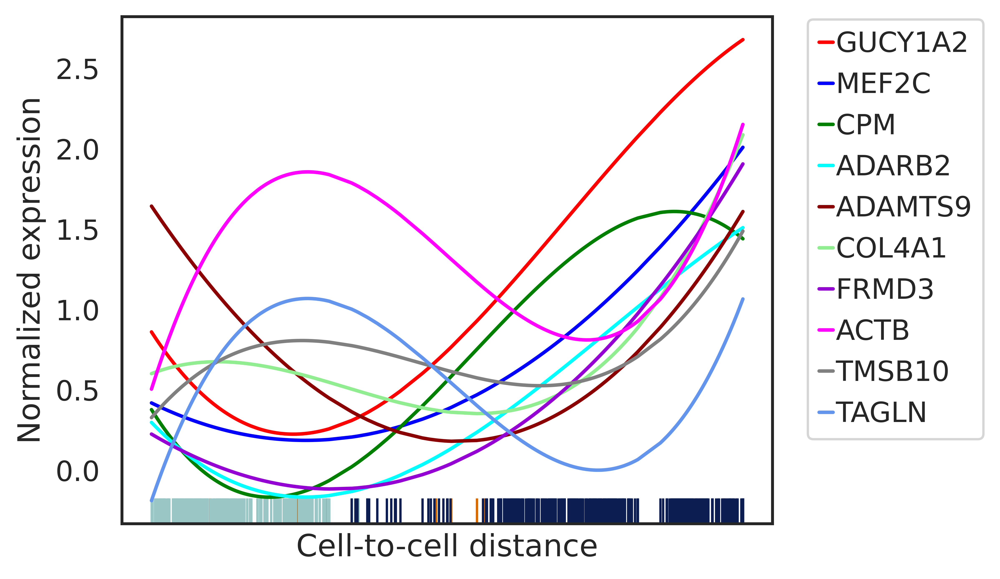

In [89]:
#(Extended figure 4g): SMC 
plt.rcParams['figure.figsize'] = (5, 4)

fig,ax=plt.subplots()

#Make the top 10 gene colors consistent with trophoblast: 
cols=['red','blue','green','cyan','darkred','lightgreen','darkviolet','magenta',
      'grey','cornflowerblue','lightsalmon', 'peru',
     'pink', 'yellow']

for i,gene in enumerate(smc_genes):
    fit=np.polyfit(df['pseudotime'].values,df[gene].values,deg=3)
    f = np.poly1d(fit)
    
    sns.lineplot(y=f(df['pseudotime']), x=df['pseudotime'].values,color=cols[i],ax=ax,label=gene)
for i,clust in enumerate(adata_smc_new.obs['cell_type_semifinal_v2'].cat.categories):
    df_sub=df[np.isin(df['clusters'],clust)]
    sns.distplot(df_sub['pseudotime'],kde=False, hist=False, rug=True, ax=ax,color= smc_col_clust[i])

ax.set_xticks([])
ax.set_xticklabels([])
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.ylabel('Normalized expression')
plt.xlabel('Cell-to-cell distance')
#plt.savefig("./DSC_revised_results/transition_plots/dSMC_lineage_transitionGenes_final_v1.pdf", dpi=800, papertype= "executive", bbox_inches='tight')
#plt.savefig("./DSC_revised_results/transition_plots/dSMC_lineage_transitionGenes_final_v1.svg", dpi=800, papertype= "executive", bbox_inches='tight')

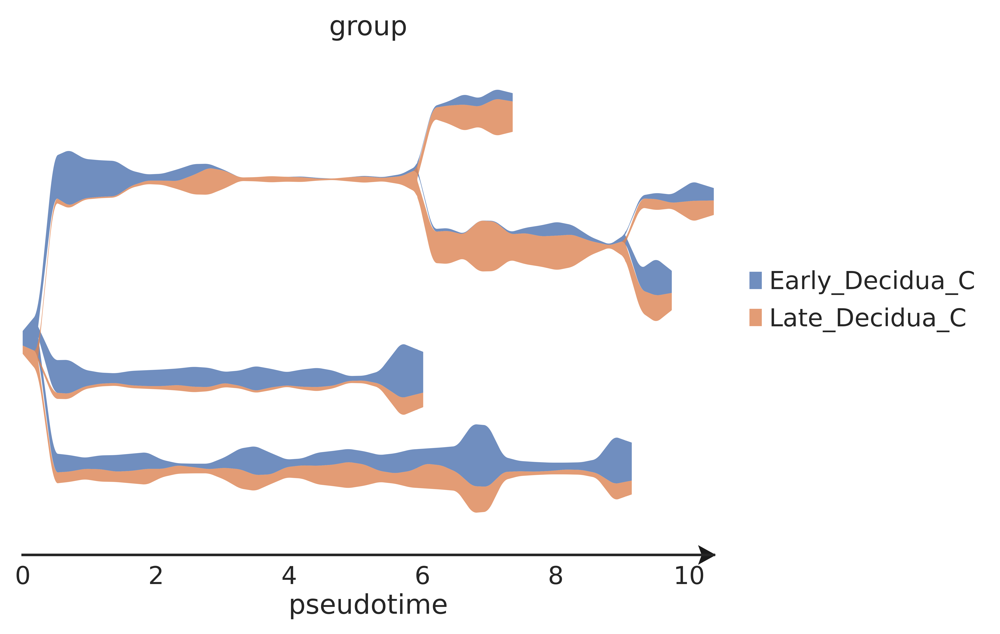

In [99]:
#Stream plot: by gestational time (Extended figure 4h)
st.plot_stream(adata_late,root= 'S0',color=['group'], dist_scale=1)